In [29]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [30]:
!pip install cartopy

In [31]:
import numpy as np
import pandas as pd
import xarray as xr
import geopandas as gpd
import random
import math

import matplotlib.pyplot as plt
from shapely import Point

import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import warnings

warnings.filterwarnings('ignore')

**Data**: https://www.kaggle.com/datasets/sumaiaparveenshupti/los-angeles-crime-data-20102020

In [32]:
recent = pd.read_csv('./Crime_Data_from_2020_to_Present.csv')[['LAT', 'LON']]
old = pd.read_csv('.s/Crime_Data_from_2010_to_2019.csv')[['LAT', 'LON']]
df = pd.concat([old, recent])
df = df[(df.LON!=0) & (df.LAT!=0)]
df

,LAT,LON
0,33.9825,-118.2695
1,33.9599,-118.3962
2,34.0224,-118.2524
3,34.1016,-118.3295
4,34.0387,-118.2488
...,...,...
276579,34.0166,-118.2058
276580,34.0527,-118.2937
276581,33.9897,-118.2827
276582,33.7424,-118.2814


<Axes: >

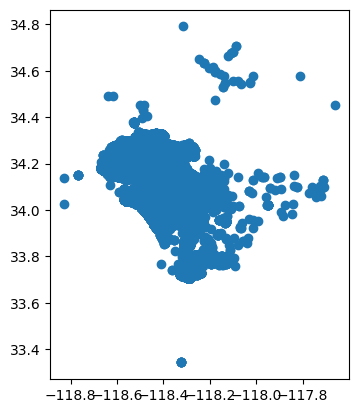

In [ ]:
geometry = []
for lat, lon in zip(df.LAT, df.LON):
  geometry.append(Point(lon, lat))

gdf = gpd.GeoDataFrame(df, geometry = geometry)
gdf.plot()

In [33]:
def coords(x,y, base=0.01):
	x, y = round(base * math.ceil(abs(x)/base),2), round(base * math.ceil(y/base),2)
	return (y,x)

def NN(data, LAT, LON):
  array = np.zeros((LAT.shape[0], LON.shape[0]),dtype=int)
  onGrid = data.apply(lambda row: coords(row.LAT, row.LON, 0.01), axis = 1).value_counts()
  for coor in onGrid.index:
    lon_idx, lat_idx = np.where(LON==coor[0]), np.where(LAT==coor[1])
    array[lat_idx,lon_idx] = int(onGrid[coor])
  return array

In [34]:
LAT, LON = np.arange(round(df.LAT.min()), round(df.LAT.max()), 0.01).astype(np.float32), np.arange(round(df.LON.min()), round(df.LON.max()), 0.01).astype(np.float32)
crimes = NN(df, LAT, LON)
ds = xr.Dataset(
    {'Crimes': (['lat', 'lon'], crimes)},
    coords={'lat': LAT, 'lon': LON})
ds

<xarray.Dataset>
Dimensions:  (lat: 200, lon: 100)
Coordinates:
  * lat      (lat) float32 33.0 33.01 33.02 33.03 ... 34.96 34.97 34.98 34.99
  * lon      (lon) float32 -119.0 -119.0 -119.0 -119.0 ... -118.0 -118.0 -118.0
Data variables:
    Crimes   (lat, lon) int64 0 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0

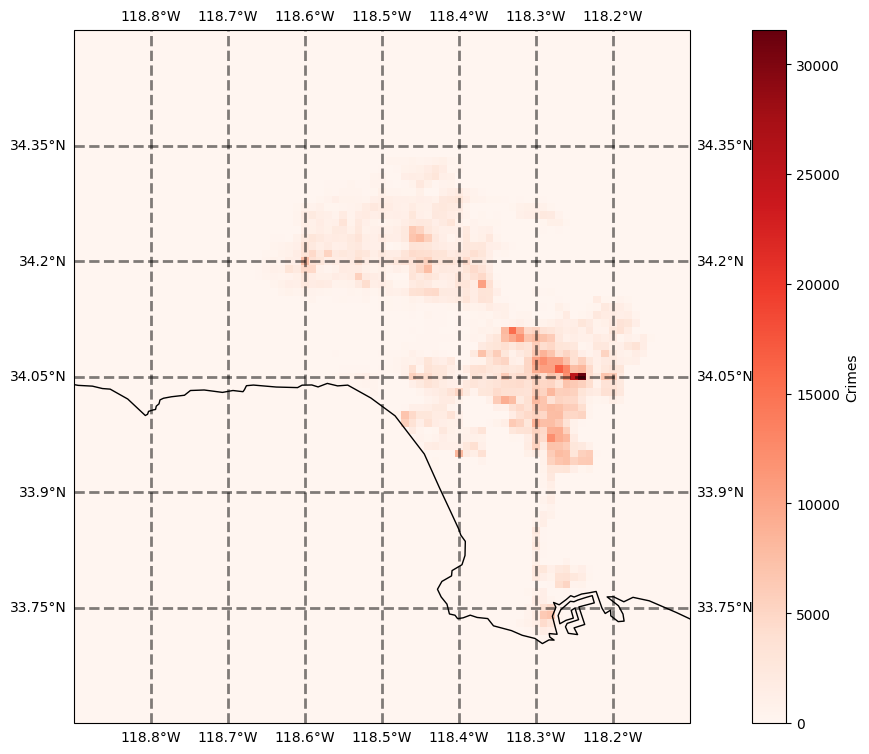

In [ ]:
fig, ax = plt.subplots(subplot_kw=dict(projection=ccrs.PlateCarree()), figsize=(16, 9))

ds.Crimes.plot(ax=ax, cmap='Reds')
ax.set_extent([-118.9, -118.1, 33.6, 34.5 ], crs=ccrs.PlateCarree())
ax.gridlines(draw_labels=True,linewidth=2, color='black', alpha=0.5, linestyle='--')
ax.add_feature(cfeature.BORDERS, edgecolor='black', linewidth=1)

ax.add_feature(cfeature.COASTLINE, edgecolor='black', linewidth=1)
ax.add_feature(cartopy.feature.RIVERS, edgecolor='blue', linewidth=0.5)
states_provinces = cfeature.NaturalEarthFeature(
            category='cultural',  name='admin_1_states_provinces',
            scale='10m', facecolor='none')

plt.show()

# PyDeck

In [35]:
!pip install pydeck

In [36]:
import pydeck as pdk

https://deck.gl/docs/api-reference/layers

# 1. Hexagons

In [ ]:
layer = pdk.Layer(
    'HexagonLayer',
    df,
    get_position=['LON', 'LAT'],
    radius=500, #bin radius
    auto_highlight=True,
    elevation_scale=50, #scale factor for bins (the greater - the higher)
    elevation_range=[0, 3000],
    pickable=True,
    extruded=True,#cell elevation
    )

view_state = pdk.ViewState(
    longitude=-118.3,
    latitude=34.4,
    zoom=8,
    min_zoom=6,
    max_zoom=15,
    bearing=-20,#left/right angle
    pitch=20, #up/down angle
    )

r = pdk.Deck(layers=[layer], initial_view_state=view_state)
r.to_html('hex.html')

<IPython.core.display.Javascript object>

# 2. Columns

In [ ]:
layer = pdk.Layer(
    'ColumnLayer',
    ds.to_dataframe().reset_index(),
    get_position=['lon', 'lat'],
    get_elevation='Crimes',
    elevation_scale=10,
    radius=200,
    get_fill_color=['Crimes', 220],
    pickable=True,
    extruded=True,
    )

view_state = pdk.ViewState(
    longitude=-118.3,
    latitude=34.4,
    zoom=8,
    min_zoom=6,
    max_zoom=15,
    bearing=-20,#left/right angle
    pitch=20, #up/down angle
    )

# Render
r = pdk.Deck(layers=[layer], initial_view_state=view_state)
r.to_html('column.html')

<IPython.core.display.Javascript object>

# 3. Scatter plots

In [37]:
layer = pdk.Layer(
    'ColumnLayer',
    df[:15000],
    get_position=['LON', 'LAT'],
    auto_highlight=True,
    get_radius=200,          # Radius is given in meters
    get_fill_color=[180, 0, 200, 140],  # Set an RGBA value for fill
    pickable=True)

view_state = pdk.ViewState(
    longitude=-118.3,
    latitude=34.4,
    zoom=8,
    min_zoom=6,
    max_zoom=15,
    bearing=-20,#left/right angle
    pitch=20, #up/down angle
    )

r = pdk.Deck(layers=[layer], initial_view_state=view_state)
r#.to_html('scatter.html')

<IPython.core.display.Javascript object>

{
  "initialViewState": {
    "bearing": -20,
    "latitude": 34.4,
    "longitude": -118.3,
    "maxZoom": 15,
    "minZoom": 6,
    "pitch": 20,
    "zoom": 8
  },
  "layers": [
    {
      "@@type": "ColumnLayer",
      "autoHighlight": true,
      "data": [
        {
          "LAT": 33.9825,
          "LON": -118.2695
        },
        {
          "LAT": 33.9599,
          "LON": -118.3962
        },
        {
          "LAT": 34.0224,
          "LON": -118.2524
        },
        {
          "LAT": 34.1016,
          "LON": -118.3295
        },
        {
          "LAT": 34.0387,
          "LON": -118.2488
        },
        {
          "LAT": 34.048,
          "LON": -118.2577
        },
        {
          "LAT": 34.0389,
          "LON": -118.2643
        },
        {
          "LAT": 34.0435,
          "LON": -118.2427
        },
        {
          "LAT": 34.045,
          "LON": -118.264
        },
        {
          "LAT": 34.0538,
          "LON": -118.2488
        },
        {
          "LAT": 34.064,
          "LON": -118.2375
        },
        {
          "LAT": 34.035,
          "LON": -118.2386
        },
        {
          "LAT": 34.0409,
          "LON": -118.2609
        },
        {
          "LAT": 34.0502,
          "LON": -118.254
        },
        {
          "LAT": 34.0515,
          "LON": -118.2424
        },
        {
          "LAT": 34.0389,
          "LON": -118.255
        },
        {
          "LAT": 34.0401,
          "LON": -118.2668
        },
        {
          "LAT": 34.0428,
          "LON": -118.2461
        },
        {
          "LAT": 34.0545,
          "LON": -118.2499
        },
        {
          "LAT": 34.0563,
          "LON": -118.2374
        },
        {
          "LAT": 34.0502,
          "LON": -118.254
        },
        {
          "LAT": 34.0454,
          "LON": -118.236
        },
        {
          "LAT": 34.0472,
          "LON": -118.2371
        },
        {
          "LAT": 34.0382,
          "LON": -118.2665
        },
        {
          "LAT": 34.0423,
          "LON": -118.2452
        },
        {
          "LAT": 34.046,
          "LON": -118.2509
        },
        {
          "LAT": 34.0461,
          "LON": -118.2476
        },
        {
          "LAT": 34.0437,
          "LON": -118.2652
        },
        {
          "LAT": 34.0357,
          "LON": -118.2563
        },
        {
          "LAT": 34.0394,
          "LON": -118.2405
        },
        {
          "LAT": 34.0446,
          "LON": -118.245
        },
        {
          "LAT": 34.045,
          "LON": -118.264
        },
        {
          "LAT": 34.0439,
          "LON": -118.2514
        },
        {
          "LAT": 34.0415,
          "LON": -118.2654
        },
        {
          "LAT": 34.048,
          "LON": -118.2577
        },
        {
          "LAT": 34.0502,
          "LON": -118.2574
        },
        {
          "LAT": 34.048,
          "LON": -118.2577
        },
        {
          "LAT": 34.0389,
          "LON": -118.2643
        },
        {
          "LAT": 34.045,
          "LON": -118.264
        },
        {
          "LAT": 34.0559,
          "LON": -118.2296
        },
        {
          "LAT": 34.0426,
          "LON": -118.2412
        },
        {
          "LAT": 34.0544,
          "LON": -118.2466
        },
        {
          "LAT": 34.0449,
          "LON": -118.2415
        },
        {
          "LAT": 34.0481,
          "LON": -118.2507
        },
        {
          "LAT": 34.048,
          "LON": -118.2577
        },
        {
          "LAT": 34.048,
          "LON": -118.2577
        },
        {
          "LAT": 34.0439,
          "LON": -118.2514
        },
        {
          "LAT": 34.0453,
          "LON": -118.2499
        },
        {
          "LAT": 34.0431,
          "LON": -118.2536
        },
        {
          "LAT": 34.0617,
          "LON": -118.2469
        },
        {
          "LAT": 34.0394,
          "LON": -118

# 4. Map style

In [38]:
 layer = pdk.Layer(
    'HexagonLayer',
    df[:1500],
    get_position=['LON', 'LAT'],
    radius=500, #bin radius
    auto_highlight=True,
    elevation_scale=50, #scale factor for bins (the greater - the higher)
    elevation_range=[0, 3000],
    pickable=True,
    extruded=True,#cell elevation
    )

view_state = pdk.ViewState(
    longitude=-118.3,
    latitude=34.4,
    zoom=8,
    min_zoom=6,
    max_zoom=15,
    bearing=-20,#left/right angle
    pitch=20, #up/down angle
    )

r = pdk.Deck(layers=[layer],
             initial_view_state=view_state,
             map_style=pdk.map_styles.LIGHT, # ‘light’, ‘dark’, ‘road’, ‘satellite’, ‘dark_no_labels’, and ‘light_no_labels
             )
r#.to_html('hex.html')

<IPython.core.display.Javascript object>

{
  "initialViewState": {
    "bearing": -20,
    "latitude": 34.4,
    "longitude": -118.3,
    "maxZoom": 15,
    "minZoom": 6,
    "pitch": 20,
    "zoom": 8
  },
  "layers": [
    {
      "@@type": "HexagonLayer",
      "autoHighlight": true,
      "data": [
        {
          "LAT": 33.9825,
          "LON": -118.2695
        },
        {
          "LAT": 33.9599,
          "LON": -118.3962
        },
        {
          "LAT": 34.0224,
          "LON": -118.2524
        },
        {
          "LAT": 34.1016,
          "LON": -118.3295
        },
        {
          "LAT": 34.0387,
          "LON": -118.2488
        },
        {
          "LAT": 34.048,
          "LON": -118.2577
        },
        {
          "LAT": 34.0389,
          "LON": -118.2643
        },
        {
          "LAT": 34.0435,
          "LON": -118.2427
        },
        {
          "LAT": 34.045,
          "LON": -118.264
        },
        {
          "LAT": 34.0538,
          "LON": -118.2488
        },
        {
          "LAT": 34.064,
          "LON": -118.2375
        },
        {
          "LAT": 34.035,
          "LON": -118.2386
        },
        {
          "LAT": 34.0409,
          "LON": -118.2609
        },
        {
          "LAT": 34.0502,
          "LON": -118.254
        },
        {
          "LAT": 34.0515,
          "LON": -118.2424
        },
        {
          "LAT": 34.0389,
          "LON": -118.255
        },
        {
          "LAT": 34.0401,
          "LON": -118.2668
        },
        {
          "LAT": 34.0428,
          "LON": -118.2461
        },
        {
          "LAT": 34.0545,
          "LON": -118.2499
        },
        {
          "LAT": 34.0563,
          "LON": -118.2374
        },
        {
          "LAT": 34.0502,
          "LON": -118.254
        },
        {
          "LAT": 34.0454,
          "LON": -118.236
        },
        {
          "LAT": 34.0472,
          "LON": -118.2371
        },
        {
          "LAT": 34.0382,
          "LON": -118.2665
        },
        {
          "LAT": 34.0423,
          "LON": -118.2452
        },
        {
          "LAT": 34.046,
          "LON": -118.2509
        },
        {
          "LAT": 34.0461,
          "LON": -118.2476
        },
        {
          "LAT": 34.0437,
          "LON": -118.2652
        },
        {
          "LAT": 34.0357,
          "LON": -118.2563
        },
        {
          "LAT": 34.0394,
          "LON": -118.2405
        },
        {
          "LAT": 34.0446,
          "LON": -118.245
        },
        {
          "LAT": 34.045,
          "LON": -118.264
        },
        {
          "LAT": 34.0439,
          "LON": -118.2514
        },
        {
          "LAT": 34.0415,
          "LON": -118.2654
        },
        {
          "LAT": 34.048,
          "LON": -118.2577
        },
        {
          "LAT": 34.0502,
          "LON": -118.2574
        },
        {
          "LAT": 34.048,
          "LON": -118.2577
        },
        {
          "LAT": 34.0389,
          "LON": -118.2643
        },
        {
          "LAT": 34.045,
          "LON": -118.264
        },
        {
          "LAT": 34.0559,
          "LON": -118.2296
        },
        {
          "LAT": 34.0426,
          "LON": -118.2412
        },
        {
          "LAT": 34.0544,
          "LON": -118.2466
        },
        {
          "LAT": 34.0449,
          "LON": -118.2415
        },
        {
          "LAT": 34.0481,
          "LON": -118.2507
        },
        {
          "LAT": 34.048,
          "LON": -118.2577
        },
        {
          "LAT": 34.048,
          "LON": -118.2577
        },
        {
          "LAT": 34.0439,
          "LON": -118.2514
        },
        {
          "LAT": 34.0453,
          "LON": -118.2499
        },
        {
          "LAT": 34.0431,
          "LON": -118.2536
        },
        {
          "LAT": 34.0617,
          "LON": -118.2469
        },
        {
          "LAT": 34.0394,
          "LON": -11

# Custom titles
https://deckgl.readthedocs.io/en/latest/tooltip.html

In [39]:

 layer = pdk.Layer(
    'HexagonLayer',
    df[:1500],
    get_position=['LON', 'LAT'],
    radius=500, #bin radius
    auto_highlight=True,
    elevation_scale=50, #scale factor for bins (the greater - the higher)
    elevation_range=[0, 3000],
    pickable=True,
    extruded=True,#cell elevation
    )

view_state = pdk.ViewState(
    longitude=-118.3,
    latitude=34.4,
    zoom=8,
    min_zoom=6,
    max_zoom=15,
    bearing=-20,#left/right angle
    pitch=20, #up/down angle
    )

r = pdk.Deck(layers=[layer],
             initial_view_state=view_state,
             map_style=pdk.map_styles.DARK, # ‘light’, ‘dark’, ‘road’, ‘satellite’, ‘dark_no_labels’, and ‘light_no_labels
             tooltip = {
                  "html": "<b>Number of crimes:</b> {elevationValue}",
                  "style": {
                        "backgroundColor": "yellow",
                        "color": "black"
                  }
                },
             )
r#.to_html('hex.html')

<IPython.core.display.Javascript object>

{
  "initialViewState": {
    "bearing": -20,
    "latitude": 34.4,
    "longitude": -118.3,
    "maxZoom": 15,
    "minZoom": 6,
    "pitch": 20,
    "zoom": 8
  },
  "layers": [
    {
      "@@type": "HexagonLayer",
      "autoHighlight": true,
      "data": [
        {
          "LAT": 33.9825,
          "LON": -118.2695
        },
        {
          "LAT": 33.9599,
          "LON": -118.3962
        },
        {
          "LAT": 34.0224,
          "LON": -118.2524
        },
        {
          "LAT": 34.1016,
          "LON": -118.3295
        },
        {
          "LAT": 34.0387,
          "LON": -118.2488
        },
        {
          "LAT": 34.048,
          "LON": -118.2577
        },
        {
          "LAT": 34.0389,
          "LON": -118.2643
        },
        {
          "LAT": 34.0435,
          "LON": -118.2427
        },
        {
          "LAT": 34.045,
          "LON": -118.264
        },
        {
          "LAT": 34.0538,
          "LON": -118.2488
        },
        {
          "LAT": 34.064,
          "LON": -118.2375
        },
        {
          "LAT": 34.035,
          "LON": -118.2386
        },
        {
          "LAT": 34.0409,
          "LON": -118.2609
        },
        {
          "LAT": 34.0502,
          "LON": -118.254
        },
        {
          "LAT": 34.0515,
          "LON": -118.2424
        },
        {
          "LAT": 34.0389,
          "LON": -118.255
        },
        {
          "LAT": 34.0401,
          "LON": -118.2668
        },
        {
          "LAT": 34.0428,
          "LON": -118.2461
        },
        {
          "LAT": 34.0545,
          "LON": -118.2499
        },
        {
          "LAT": 34.0563,
          "LON": -118.2374
        },
        {
          "LAT": 34.0502,
          "LON": -118.254
        },
        {
          "LAT": 34.0454,
          "LON": -118.236
        },
        {
          "LAT": 34.0472,
          "LON": -118.2371
        },
        {
          "LAT": 34.0382,
          "LON": -118.2665
        },
        {
          "LAT": 34.0423,
          "LON": -118.2452
        },
        {
          "LAT": 34.046,
          "LON": -118.2509
        },
        {
          "LAT": 34.0461,
          "LON": -118.2476
        },
        {
          "LAT": 34.0437,
          "LON": -118.2652
        },
        {
          "LAT": 34.0357,
          "LON": -118.2563
        },
        {
          "LAT": 34.0394,
          "LON": -118.2405
        },
        {
          "LAT": 34.0446,
          "LON": -118.245
        },
        {
          "LAT": 34.045,
          "LON": -118.264
        },
        {
          "LAT": 34.0439,
          "LON": -118.2514
        },
        {
          "LAT": 34.0415,
          "LON": -118.2654
        },
        {
          "LAT": 34.048,
          "LON": -118.2577
        },
        {
          "LAT": 34.0502,
          "LON": -118.2574
        },
        {
          "LAT": 34.048,
          "LON": -118.2577
        },
        {
          "LAT": 34.0389,
          "LON": -118.2643
        },
        {
          "LAT": 34.045,
          "LON": -118.264
        },
        {
          "LAT": 34.0559,
          "LON": -118.2296
        },
        {
          "LAT": 34.0426,
          "LON": -118.2412
        },
        {
          "LAT": 34.0544,
          "LON": -118.2466
        },
        {
          "LAT": 34.0449,
          "LON": -118.2415
        },
        {
          "LAT": 34.0481,
          "LON": -118.2507
        },
        {
          "LAT": 34.048,
          "LON": -118.2577
        },
        {
          "LAT": 34.048,
          "LON": -118.2577
        },
        {
          "LAT": 34.0439,
          "LON": -118.2514
        },
        {
          "LAT": 34.0453,
          "LON": -118.2499
        },
        {
          "LAT": 34.0431,
          "LON": -118.2536
        },
        {
          "LAT": 34.0617,
          "LON": -118.2469
        },
        {
          "LAT": 34.0394,
          "LON": -11

# Interactive angle
https://deckgl.readthedocs.io/en/latest/event_handling.html

In [40]:
from ipywidgets import HTML

text = HTML(value='Move the viewpoint')

layer = pdk.Layer(
    'HexagonLayer',
    df,
    get_position=['LON', 'LAT'],
    radius=500, #bin radius
    auto_highlight=True,
    elevation_scale=50, #scale factor for bins (the greater - the higher)
    elevation_range=[0, 3000],
    pickable=True,
    extruded=True,#cell elevation
    )

view_state = pdk.ViewState(
    longitude=-118.3,
    latitude=34.4,
    zoom=8,
    min_zoom=6,
    max_zoom=15,
    bearing=-20,#left/right angle
    pitch=20, #up/down angle
    )

r = pdk.Deck(layers=[layer],
             initial_view_state=view_state,
             map_style=pdk.map_styles.DARK)

def filter_by_bbox(row, west_lng, east_lng, north_lat, south_lat):
    return west_lng < row['lng'] < east_lng and south_lat < row['lat'] < north_lat

def filter_by_viewport(widget_instance, payload):
    west_lng, north_lat = payload['data']['nw']
    east_lng, south_lat = payload['data']['se']
    filtered_df = df[df.apply(lambda row: filter_by_bbox(row, west_lng, east_lng, north_lat, south_lat), axis=1)]


r.deck_widget.on_click(filter_by_viewport)
r.to_html('angle.html')

<IPython.core.display.Javascript object>